# Визуализация графика лосса и работы модели

## Визуализация графиков лосса и метрик

In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

In [2]:
val_losses = np.loadtxt('val_losses.txt')
val_mses = np.loadtxt('val_scores_metric0.txt')
val_rels = np.loadtxt('val_scores_metric1.txt')
n_epochs = len(val_losses)

In [3]:
epoch_ends = []
pos = 0
for epoch in range(n_epochs):
    train_loss = np.loadtxt('losses_on_epoch{}.txt'.format(epoch + 1))
    train_mse = np.loadtxt('scores_on_epoch{}_metric0.txt'.format(epoch + 1))
    train_rel = np.loadtxt('scores_on_epoch{}_metric1.txt'.format(epoch + 1))
    pos += len(train_loss)
    epoch_ends.append(pos)
    if epoch == 0:
        train_losses = train_loss
        train_mses = train_mse
        train_rels = train_rel
    else:
        train_losses = np.concatenate([train_losses, train_loss])
        train_mses = np.concatenate([train_mses, train_mse])
        train_rels = np.concatenate([train_rels, train_rel])

In [4]:
def running_mean(X, n):
    cumsum = np.cumsum(X)
    return (cumsum[n:] - cumsum[:-n]) / n

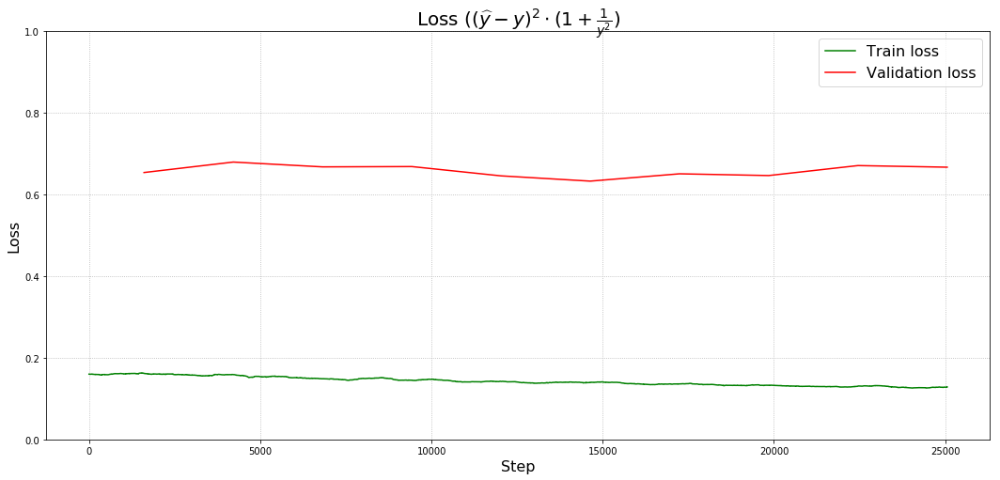

In [5]:
plt.figure(figsize=(18, 8))
plt.title('Loss ($(\widehat{y} - y)^2 \cdot (1 + \\frac{1}{y^2}$)', fontsize=20)
plt.plot(running_mean(train_losses, 1000), 
         color='g', label='Train loss')
plt.plot(np.array(epoch_ends) - 1000, val_losses, color='r', label='Validation loss')
plt.grid(ls=':')
plt.ylim((0., 1.))
plt.xlabel('Step', fontsize=16)
plt.ylabel('Loss', fontsize=16)
plt.legend(fontsize=16)

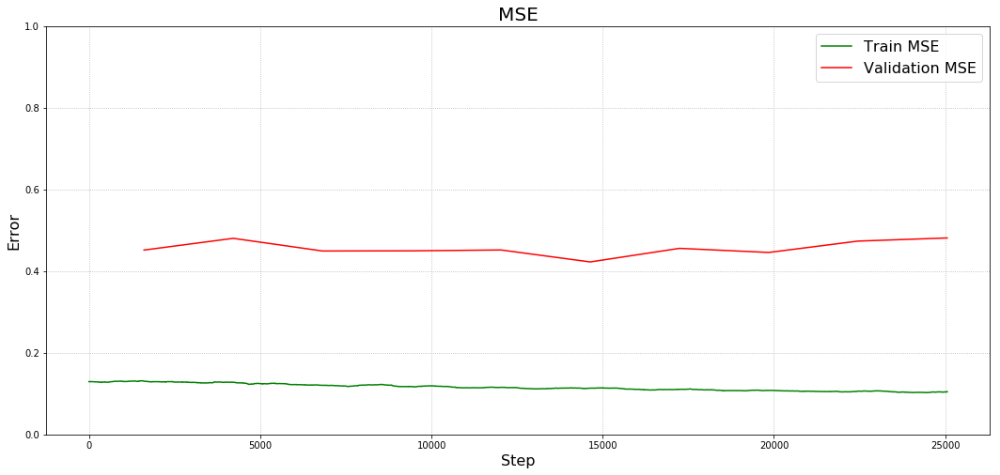

In [6]:
plt.figure(figsize=(18, 8))
plt.title('MSE', fontsize=20)
plt.plot(running_mean(train_mses, 1000), 
         color='g', label='Train MSE')
plt.plot(np.array(epoch_ends) - 1000, val_mses, color='r', label='Validation MSE')
plt.grid(ls=':')
plt.ylim((0., 1.))
plt.xlabel('Step', fontsize=16)
plt.ylabel('Error', fontsize=16)
plt.legend(fontsize=16)

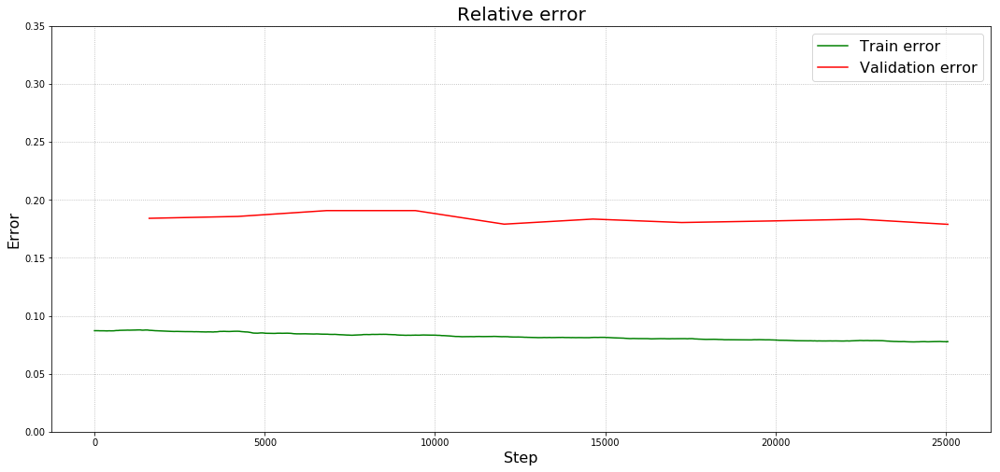

In [7]:
plt.figure(figsize=(18, 8))
plt.title('Relative error', fontsize=20)
plt.plot(running_mean(train_rels, 1000), 
         color='g', label='Train error')
plt.plot(np.array(epoch_ends) - 1000, val_rels, color='r', label='Validation error')
plt.grid(ls=':')
plt.ylim((0., 0.35))
plt.xlabel('Step', fontsize=16)
plt.ylabel('Error', fontsize=16)
plt.legend(fontsize=16)

## Загрузка датасета

In [8]:
import h5py
val_data_file = h5py.File('/home/kmouraviev/NYU_dataset_hdf5/validation_data_different_scenes.hdf5', 'r')
rgbs_val = np.array(val_data_file['data'])
depths_val = np.array(val_data_file['label'])

In [9]:
test_data_file = h5py.File('/home/kmouraviev/NYU_dataset_hdf5/validation_data_different_collections.hdf5', 'r')
rgbs_test = np.array(test_data_file['data'])
depths_test = np.array(test_data_file['label'])

## Визуализация работы модели

In [10]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

In [11]:
import sys
sys.path.append('/home/kmouraviev')

In [12]:
from tensorflow_resnet.my_batch_normalization import MyBatchNormalization

Using TensorFlow backend.


In [13]:
import tensorflow as tf

In [14]:
def mean_relative_squared_error(labels, predictions):
    sq_error = (labels - predictions) ** 2
    return tf.reduce_mean(sq_error * (1 + 2 * tf.minimum(1 / labels ** 2, 4)))

def relative_error(labels, predictions):
    return tf.abs(labels - predictions) / tf.maximum(labels, 0.5)

def interleave(tensors, axis):
    old_shape = tensors[0].get_shape().as_list()[1:]
    new_shape = [-1] + old_shape
    new_shape[axis] *= len(tensors)
    return tf.reshape(tf.stack(tensors, axis + 1), new_shape)

In [15]:
def unpooling(x):
    import tensorflow as tf
    left = interleave([x, tf.zeros_like(x)], axis=1)
    right = interleave([tf.zeros_like(x), tf.zeros_like(x)], axis=1)
    result = interleave([left, right], axis=2)
    return result

In [16]:
from keras.models import load_model
model = load_model('model_on_epoch5.hdf5', custom_objects={'MyBatchNormalization': MyBatchNormalization,
                                                            'mean_relative_squared_error': mean_relative_squared_error,
                                                            'relative_error': relative_error,
                                                            'interleave': interleave,
                                                            'unpooling': unpooling})

In [17]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 384, 512, 3)  0                                            
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (None, 390, 518, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 192, 256, 64) 9408        zero_padding2d_1[0][0]           
__________________________________________________________________________________________________
my_batch_normalization_1 (MyBat (None, 192, 256, 64) 256         conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation

### Валидация на тех же коллекциях

In [18]:
val_prediction = model.predict(rgbs_val, batch_size=1)
mse = np.mean((val_prediction - depths_val) ** 2)
print('MSE on different scenes:', mse)
rel_error = np.mean(np.abs(val_prediction - depths_val) / np.maximum(depths_val, 0.5))
print('Relative error on different scenes:', rel_error)

MSE on different scenes: 0.45188880331705644
Relative error on different scenes: 0.17907870469897819


In [19]:
val_prediction = np.maximum(val_prediction, 0.5)
depths_val = np.maximum(depths_val, 0.5)
rel_error = np.maximum(val_prediction / depths_val, depths_val / val_prediction)
print('val delta_1:', np.mean(rel_error < 1.25))
print('val delta_2:', np.mean(rel_error < 1.25 ** 2))
print('val delta_3:', np.mean(rel_error < 1.25 ** 3))

val delta_1: 0.7340524840050754
val delta_2: 0.9358287176476878
val delta_3: 0.9857624534736354


In [20]:
def unpreprocess(img):
    img_min = -123
    img_max = 151
    return (img - img_min) / (img_max - img_min)

/home/kmouraviev/anaconda/envs/tensorflow_py36_1/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


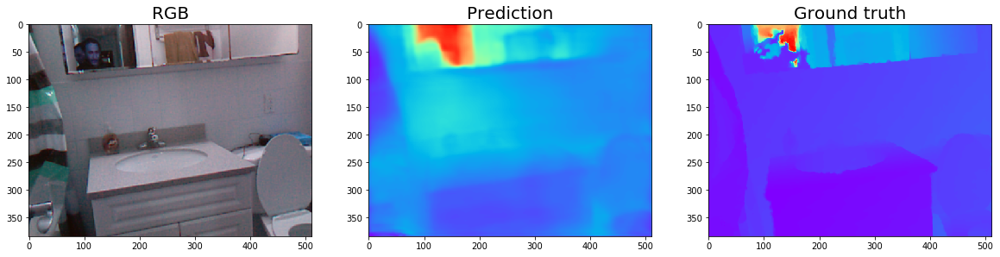

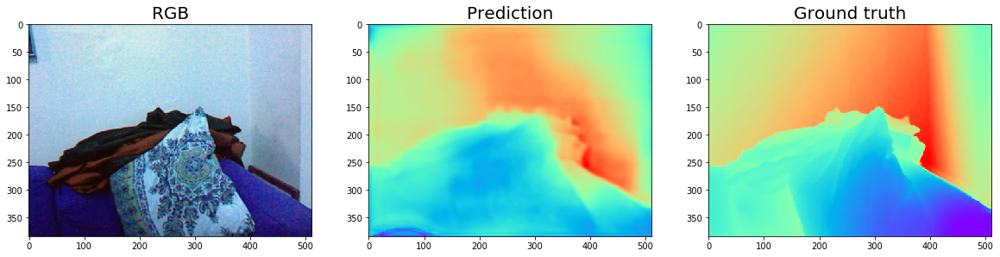

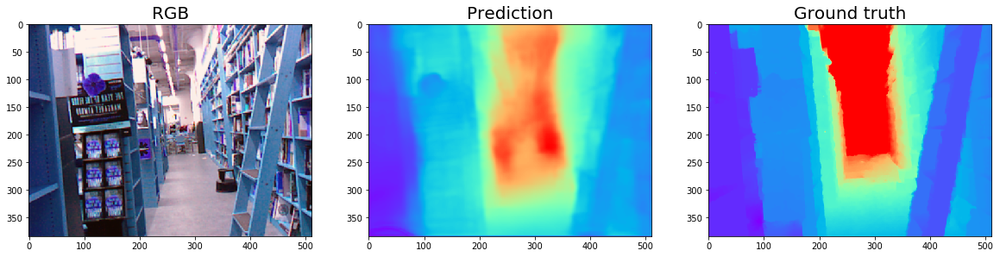

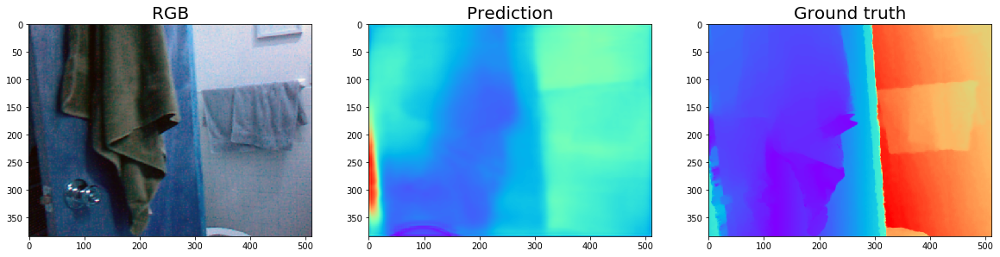

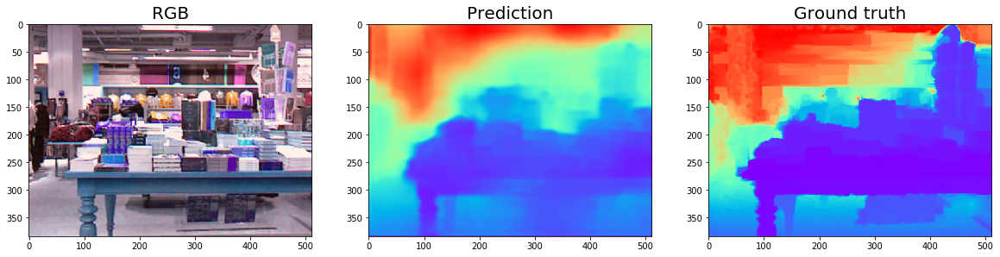

...

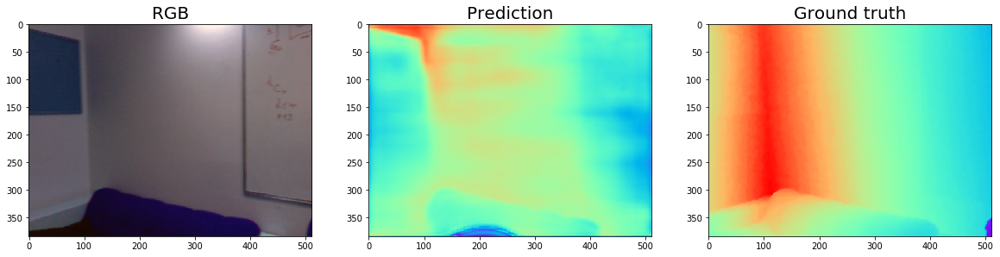

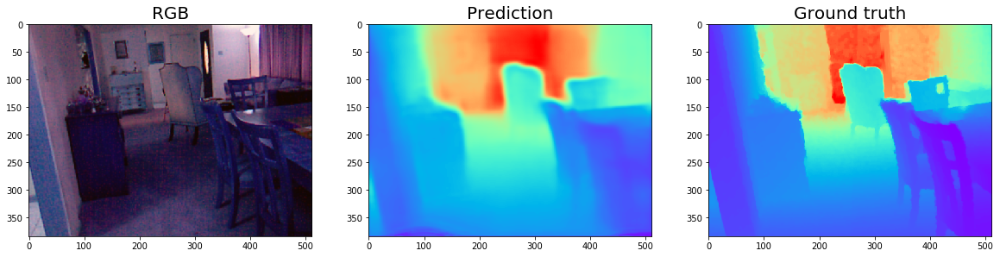

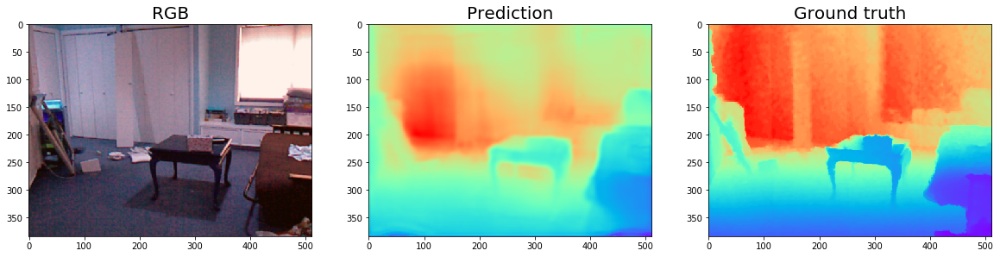

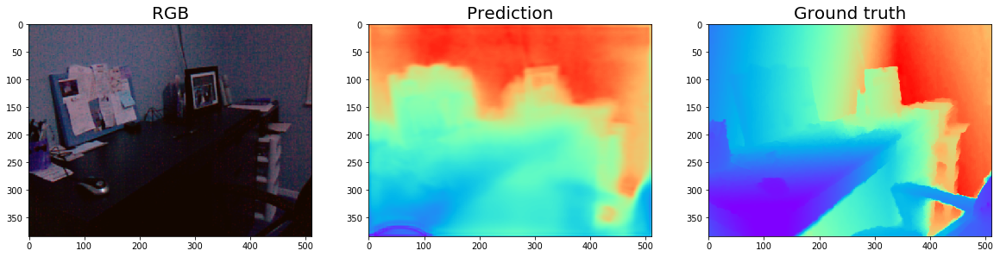

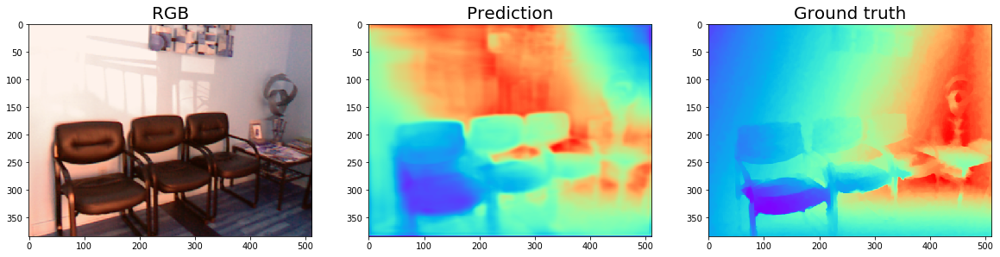

In [21]:
rgbs_val_sample = rgbs_val[::534]
depths_val_sample = depths_val[::534]
val_prediction_sample = model.predict(rgbs_val_sample)
for i in range(len(rgbs_val_sample)):
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 3, 1)
    plt.title('RGB', fontsize=20)
    plt.imshow(unpreprocess(rgbs_val_sample[i]))
    plt.subplot(1, 3, 2)
    plt.title('Prediction', fontsize=20)
    plt.imshow(val_prediction_sample[i] / 10, cmap='rainbow')
    plt.subplot(1, 3, 3)
    plt.title('Ground truth', fontsize=20)
    plt.imshow(depths_val_sample[i] / 10, cmap='rainbow')

In [22]:
error = (val_prediction - depths_val) ** 2
relative_error = np.abs(val_prediction - depths_val) / np.maximum(depths_val, 0.5)
target_pixels = (depths_val < 1)
target_mse = (error * target_pixels).sum() / target_pixels.sum()
target_rel_error = (relative_error * target_pixels).sum() / target_pixels.sum()
print('On objects with depth < 1m:')
print('MSE:', target_mse)
print('Relative_error:', target_rel_error)
print('\n')
target_pixels = np.logical_and(depths_val > 1, depths_val < 2)
target_mse = (error * target_pixels).sum() / target_pixels.sum()
target_rel_error = (relative_error * target_pixels).sum() / target_pixels.sum()
print('On objects with depth between 1m and 2m:')
print('MSE:', target_mse)
print('Relative_error:', target_rel_error)
print('\n')
target_pixels = np.logical_and(depths_val > 2, depths_val < 5)
target_mse = (error * target_pixels).sum() / target_pixels.sum()
target_rel_error = (relative_error * target_pixels).sum() / target_pixels.sum()
print('On objects with depth between 2m and 5m:')
print('MSE:', target_mse)
print('Relative_error:', target_rel_error)
print('\n')
target_pixels = (depths_val > 5)
target_mse = (error * target_pixels).sum() / target_pixels.sum()
target_rel_error = (relative_error * target_pixels).sum() / target_pixels.sum()
print('On objects with depth > 5m:')
print('MSE:', target_mse)
print('Relative_error:', target_rel_error)
print('\n')

On objects with depth < 1m:
MSE: 0.3968591332676442
Relative_error: 0.5406408594396439


On objects with depth between 1m and 2m:
MSE: 0.19696856154662842
Relative_error: 0.20608374011268527


On objects with depth between 2m and 5m:
MSE: 0.32309201229913603
Relative_error: 0.12999994111904523


On objects with depth > 5m:
MSE: 1.93534718412387
Relative_error: 0.16791196878935574




### Валидация на других коллекциях

In [23]:
test_prediction = model.predict(rgbs_test, batch_size=1)
mse = np.mean((test_prediction - depths_test) ** 2)
print('MSE on different collections:', mse)
rel_error = np.mean(np.abs(test_prediction - depths_test) / np.maximum(depths_test, 0.5))
print('Relative error on different scenes:', rel_error)

MSE on different collections: 0.6846558909873137
Relative error on different scenes: 0.2257591201986656


In [24]:
test_prediction = np.maximum(test_prediction, 0.5)
depths_test = np.maximum(depths_test, 0.5)
rel_error = np.maximum(test_prediction / depths_test, depths_test / test_prediction)
print('Test delta_1:', np.mean(rel_error < 1.25))
print('Test delta_2:', np.mean(rel_error < 1.25 ** 2))
print('Test delta_3:', np.mean(rel_error < 1.25 ** 3))

Test delta_1: 0.6493744532766428
Test delta_2: 0.8790244267455448
Test delta_3: 0.9631858066271646


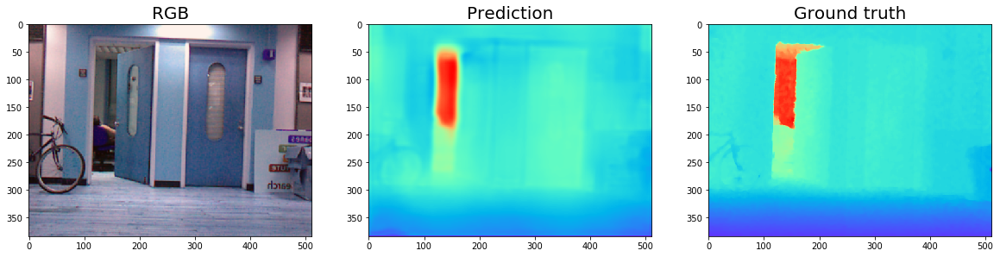

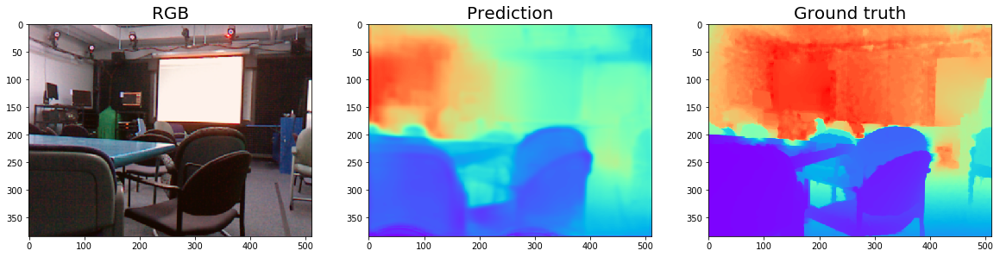

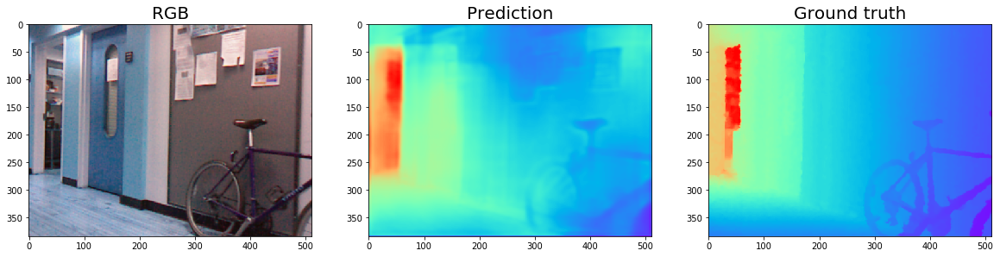

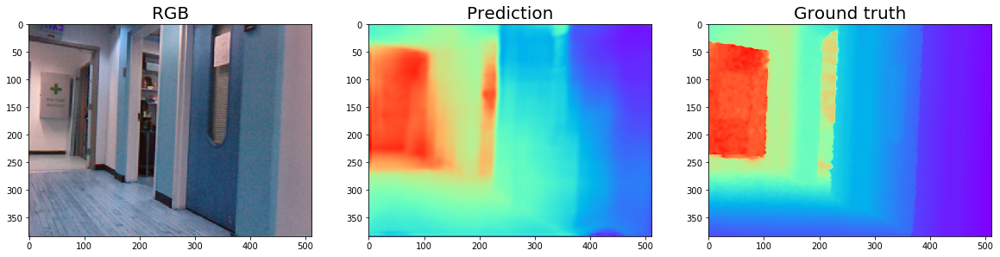

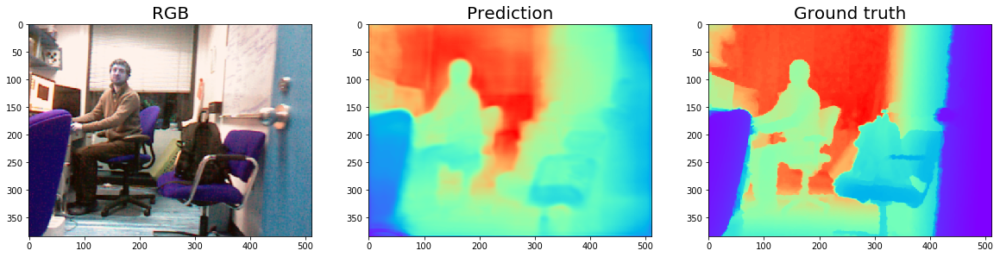

...

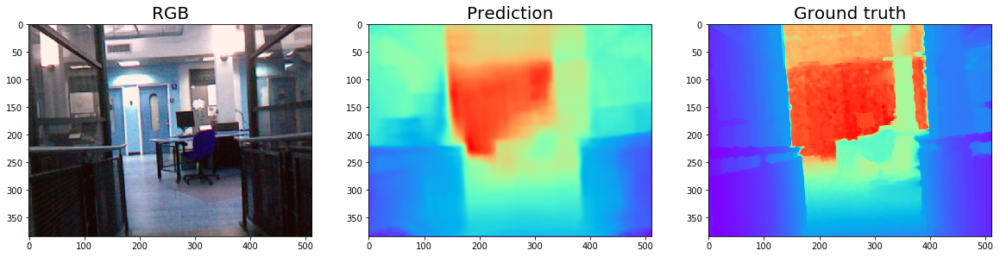

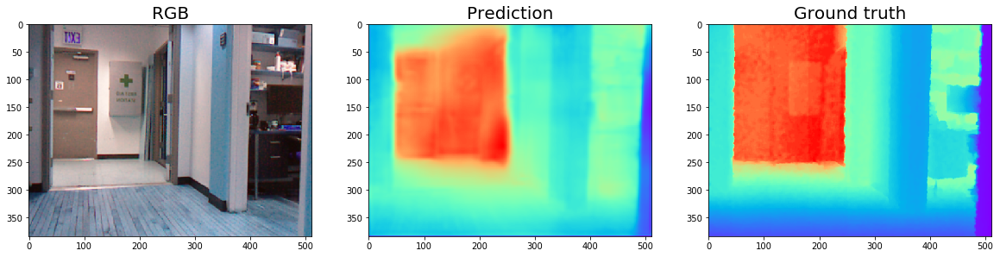

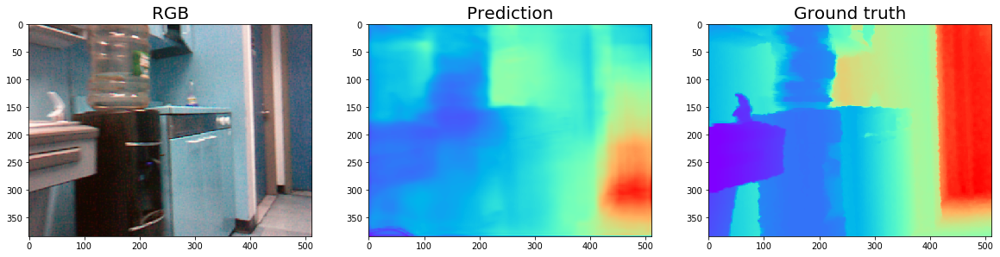

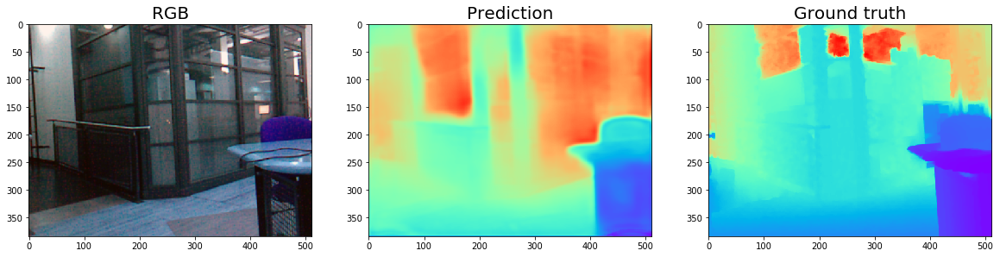

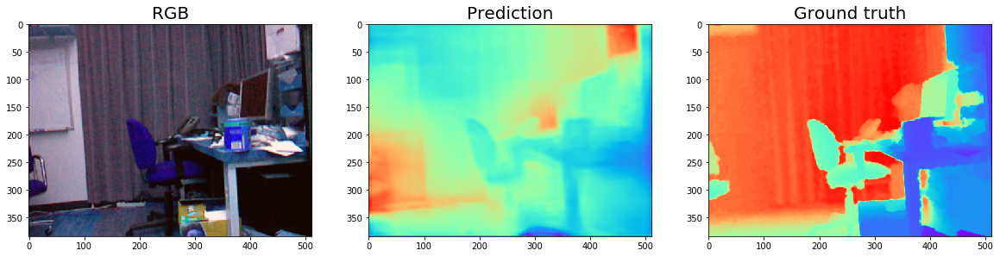

In [25]:
rgbs_test_sample = rgbs_test[::128]
depths_test_sample = depths_test[::128]
test_prediction_sample = model.predict(rgbs_test_sample)
for i in range(len(rgbs_test_sample)):
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 3, 1)
    plt.title('RGB', fontsize=20)
    plt.imshow(unpreprocess(rgbs_test_sample[i]))
    plt.subplot(1, 3, 2)
    plt.title('Prediction', fontsize=20)
    plt.imshow(test_prediction_sample[i] / 10, cmap='rainbow')
    plt.subplot(1, 3, 3)
    plt.title('Ground truth', fontsize=20)
    plt.imshow(depths_test_sample[i] / 10, cmap='rainbow')

In [26]:
error = (test_prediction - depths_test) ** 2
relative_error = np.abs(test_prediction - depths_test) / np.maximum(depths_test, 0.5)
target_pixels = (depths_test < 1)
target_mse = (error * target_pixels).sum() / target_pixels.sum()
target_mse = (error * target_pixels).sum() / target_pixels.sum()
target_rel_error = (relative_error * target_pixels).sum() / target_pixels.sum()
print('On objects with depth < 1m:')
print('MSE:', target_mse)
print('Relative_error:', target_rel_error)
print('\n')
target_pixels = np.logical_and(depths_test > 1, depths_test < 2)
target_mse = (error * target_pixels).sum() / target_pixels.sum()
target_rel_error = (relative_error * target_pixels).sum() / target_pixels.sum()
print('On objects with depth between 1m and 2m:')
print('MSE:', target_mse)
print('Relative_error:', target_rel_error)
print('\n')
target_pixels = np.logical_and(depths_test > 2, depths_test < 5)
target_mse = (error * target_pixels).sum() / target_pixels.sum()
target_rel_error = (relative_error * target_pixels).sum() / target_pixels.sum()
print('On objects with depth between 2m and 5m:')
print('MSE:', target_mse)
print('Relative_error:', target_rel_error)
print('\n')
target_pixels = (depths_test > 5)
target_mse = (error * target_pixels).sum() / target_pixels.sum()
target_rel_error = (relative_error * target_pixels).sum() / target_pixels.sum()
print('On objects with depth > 5m:')
print('MSE:', target_mse)
print('Relative_error:', target_rel_error)
print('\n')

On objects with depth < 1m:
MSE: 0.5482446402493315
Relative_error: 0.7550310771891879


On objects with depth between 1m and 2m:
MSE: 0.3250026833542925
Relative_error: 0.29109511176479097


On objects with depth between 2m and 5m:
MSE: 0.417853479599344
Relative_error: 0.15751778785806989


On objects with depth > 5m:
MSE: 2.4992561670585904
Relative_error: 0.17920463641041615


